# Downsample block tests

This notebook is for test different internal structures for a downsample layer in an U-net. The goal is to adjust the network input (the single embedding vector of an embedding layer) and the network weights to match the output of the network to a target feature map.

In [1]:
import tensorflow as tf
import os
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)
tf.autograph.set_verbosity(0)
import time
from matplotlib import pyplot as plt
from matplotlib.image import imread
from IPython import display
import numpy as np
from PIL import Image, ImageDraw
import glob
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())
#tf.compat.v1.disable_eager_execution()

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 11329066459325300391
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4986830848
locality {
  bus_id: 1
  links {
  }
}
incarnation: 9922626805509707300
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


## Enable saving to Google Drive if working with colab, to external SSD, or disable if saving locally

In [2]:
def save_to(save = "locally"):
  if save == "colab":
    from google.colab import drive
    drive.mount('/content/drive')
    %cd drive/MyDrive/Colab Notebooks/drones
  elif save == "ssd":
    os.chdir("D:/GanNoMask")

save_to("ssd")

In [3]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_png(image)
  w = tf.shape(image)[1]
  real_image = image[:, :w, :]
  real_image = tf.cast(real_image, tf.float32)
  return real_image

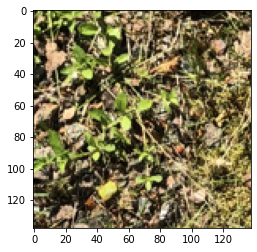

In [4]:
re = load("testtarget.png") / 255
plt.figure()
plt.imshow(re)

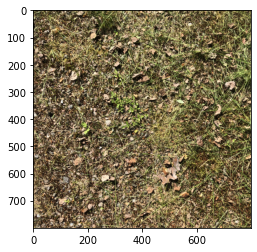

In [5]:
inp = load("testinput.png") / 255
plt.figure()
plt.imshow(inp)

## Constants
Batch size is 1 for these tests, because the goal is to match the network output to a single feature map. Image width and height must be sufficiently large to provide a good statistical sample over the spatial plane. The convolutions will somewhat reduce the network output spatial size due to 'valid' padding. The network is hard-coded to have 1 input channel and 2 output channels.

In [6]:
BATCH_SIZE = 1
IMG_WIDTH = 1314
IMG_HEIGHT = 1314

## Isotropic low-pass anti-aliasing filter
To ensure that the network operation is not affected by the image axis orientations, and that the network operation is unaffected by sub-pixel shifts, an isotropic anti-aliasing filter is used with horizontal and vertical frequency domain overhead defined by an oversampling factor.

See: https://dsp.stackexchange.com/questions/58301/2-d-circularly-symmetric-low-pass-filter for the filter kernel calculation and https://dsp.stackexchange.com/questions/58226/auto-detection-of-rotation-angle-on-arbitrary-image-with-orthogonal-features/58287#58287 for the window function calculation.


In [7]:
oversampling = 2  # Oversampling factor, 2 is a good choice
kernelN = 9  # Horizontal size of the kernel, also its vertical size. Must be odd. 9 is a good choice when oversampling == 2.

from scipy import special

def circularLowpassKernel(omega_c, N):  # omega = cutoff frequency in radians (pi is max), N = horizontal size of the kernel, also its vertical size, must be odd.
  kernel = np.fromfunction(lambda x, y: omega_c*special.j1(omega_c*np.sqrt((x - (N - 1)/2)**2 + (y - (N - 1)/2)**2))/(2*np.pi*np.sqrt((x - (N - 1)/2)**2 + (y - (N - 1)/2)**2)), [N, N])
  kernel[(N - 1)//2, (N - 1)//2] = omega_c**2/(4*np.pi)
  return kernel 

def rotatedCosineWindow(N):  # N = horizontal size of the targeted kernel, also its vertical size, must be odd.
  return np.fromfunction(lambda y, x: np.maximum(np.cos(np.pi/2*np.sqrt(((x - (N - 1)/2)/((N - 1)/2 + 1))**2 + ((y - (N - 1)/2)/((N - 1)/2 + 1))**2)), 0), [N, N])

window = rotatedCosineWindow(kernelN)

kernel_cutoff_pi = circularLowpassKernel(np.pi/oversampling, kernelN)
kernel_cutoff_minipi = circularLowpassKernel(0.95 * np.pi/oversampling, kernelN)

windowedkernel_cutoff_minipi = kernel_cutoff_minipi*window
windowedkernel_cutoff_minipi /= np.sum(windowedkernel_cutoff_minipi, axis=(0, 1)) # Normalize to sum = 1
windowedkernel_cutoff_minipi = windowedkernel_cutoff_minipi.astype(np.float32)


windowedkernel_cutoff_pi = kernel_cutoff_pi*window
windowedkernel_cutoff_pi /= np.sum(windowedkernel_cutoff_pi, axis=(0, 1)) # Normalize to sum = 1
windowedkernel_cutoff_pi = windowedkernel_cutoff_pi.astype(np.float32)

#Divide by zero warnings are OK

C:\ProgramData\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


Plot the anti-aliasing filter kernel and frequency response:

Kernel:


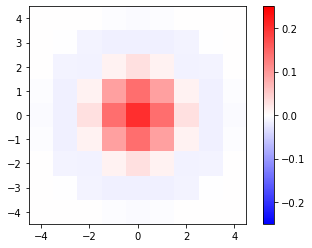

Frequency response:


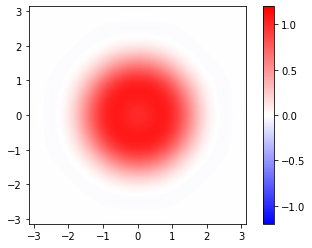

Kernel:


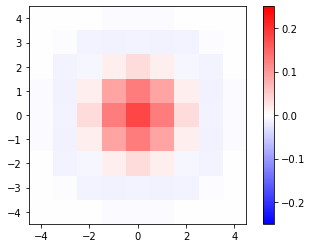

Frequency response:


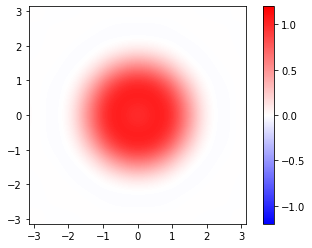

In [8]:
print("Kernel:")
plt.imshow(windowedkernel_cutoff_pi, vmin=-0.25, vmax=0.25, cmap='bwr', extent=[-kernelN/2, kernelN/2, -kernelN/2, kernelN/2])
plt.colorbar()
plt.show()

print("Frequency response:")
freq_resp = np.real(np.fft.fftshift(np.fft.fft2(np.roll(np.pad(windowedkernel_cutoff_pi, 100, mode = 'constant', constant_values = 0), shift = (-kernelN//2-99, -kernelN//2-99), axis = (0, 1)))))
plt.imshow(freq_resp, vmin=-1.2, vmax=1.2, cmap='bwr', extent=[-np.pi, np.pi, -np.pi, np.pi])
plt.colorbar()
plt.show()

print("Kernel:")
plt.imshow(windowedkernel_cutoff_minipi, vmin=-0.25, vmax=0.25, cmap='bwr', extent=[-kernelN/2, kernelN/2, -kernelN/2, kernelN/2])
plt.colorbar()
plt.show()

print("Frequency response:")
freq_resp = np.real(np.fft.fftshift(np.fft.fft2(np.roll(np.pad(windowedkernel_cutoff_minipi, 100, mode = 'constant', constant_values = 0), shift = (-kernelN//2-99, -kernelN//2-99), axis = (0, 1)))))
plt.imshow(freq_resp, vmin=-1.2, vmax=1.2, cmap='bwr', extent=[-np.pi, np.pi, -np.pi, np.pi])
plt.colorbar()
plt.show()

#plt.plot(freq_resp[100])

# Network definition and network and target noise initialization

Initialize the network input, the network structure, the network, and target noise which is white noise with frequency-domain overhead as dictated by the oversampling factor (defined earlier):

In [9]:
# Initialize an anti-aliasing layer
def init_antial(layer, kernel):
  reps = np.shape(layer.get_weights())[3]
  new_w = tf.repeat(tf.constant([[kernel]]), reps, axis = 3)
  new_w = tf.reshape(new_w, [kernel.shape[0], kernel.shape[1], reps, 1])
  layer.set_weights([new_w])
  layer.trainable = False

In [10]:
# Define the multiplication layer for the unet
def multiply_layer(dim):
  two_row_root = tf.constant([[0, 0], [0, 4]])
  almost_shape = tf.tile(two_row_root, [dim, dim])
  shape = tf.repeat(tf.expand_dims(almost_shape, axis = -1), 1, axis = -1)
  shape = tf.cast(shape, "float32")
  shape = tf.expand_dims(shape, axis = 0)
  return shape

multify66 = multiply_layer(130)
multify62 = multiply_layer(170)
multify60 = multiply_layer(150)

In [11]:
def Model():  
  z = tf.keras.Input(shape = (800, 800, 3), name = "input")
  #multify66 = tf.keras.Input(shape = (432, 432, 256), name = "multify66")
  multify62 = tf.keras.Input(shape = (340, 340, 128), name = "multify64")
  multify60 = tf.keras.Input(shape = (300, 300, 64), name = "multify60")
  
  #y1 = multify66
  y2 = multify62
  y3 = multify60
  initializer = tf.keras.initializers.RandomUniform(-1, 1)
  
  x = z
  
  ## Try increase to 4 in the first downsample
  
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "1antial_input")(x)
  
  #-----------------First down
  
  x = tf.keras.layers.Conv2D(64, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "1learned_conv_1")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "1antial_intermediate")(x)
  x = tf.keras.layers.Conv2D(64, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "1learned_conv_2")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=2, padding='valid', use_bias=False, name = "1antial_stride_2")(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "1antial_down_last")(x)
  #x1 = tf.keras.layers.ZeroPadding2D(padding = ((0, 1), (0, 1)), name = "1extra_padding")(x) 490x490
  #x1 = tf.keras.layers.Cropping2D(cropping = (272, 272), name = "cropping_one")(x) #Size 127x127
  
  #-----------------Second down
  
  x = tf.keras.layers.Conv2D(128, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "2learned_conv_1")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "2antial_intermediate")(x)
  x = tf.keras.layers.Conv2D(128, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "2learned_conv_2")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=2, padding='valid', use_bias=False, name = "2antial_stride_2")(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "2antial_down_last")(x)
  x = tf.keras.layers.BatchNormalization(name = "2batch_norm_down")(x) # Size 233x233
  #x2 = tf.keras.layers.ZeroPadding2D(padding = ((0, 1), (0, 1)), name = "2extra_padding")(x)
  #x2 = tf.keras.layers.Cropping2D(cropping = (94, 94), name = "cropping_two")(x)#77x77
  
  #-----------------Third down
 
  #Move commented out layers here

  
  #-----------------Second up
  #
  #x = tf.keras.layers.Concatenate()([x, x2])
  x = tf.keras.layers.UpSampling2D(size = (2, 2), name = "2up_sampling")(x)
  x = tf.keras.layers.multiply([x, y2])
  x = tf.keras.layers.ZeroPadding2D(padding = ((0, 1), (0, 1)), name = "2zero_padding")(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "2antial_up1")(x)
  x = tf.keras.layers.Conv2D(64, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "2learned_conv3")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=2, padding='valid', use_bias=False, name = "2antial_up2")(x)
  x = tf.keras.layers.Conv2D(64, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "2learned_conv_4")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "2antial_up3")(x)
  x = tf.keras.layers.BatchNormalization(name = "2batch_norm_up")(x) # Size 233x233

  
  #-----------------Third up
  #x = tf.keras.layers.Concatenate()([x, x1])
  x = tf.keras.layers.UpSampling2D(size = (2, 2), name = "3up_sampling")(x)
  x = tf.keras.layers.multiply([x, y3])
  x = tf.keras.layers.ZeroPadding2D(padding = ((0, 1), (0, 1)), name = "3zero_padding")(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "3antial_up1")(x)
  x = tf.keras.layers.Conv2D(3, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "3learned_conv3")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=2, padding='valid', use_bias=False, name = "3antial_up2")(x)
  x = tf.keras.layers.Conv2D(3, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "3learned_conv_4")(x)
  x = tf.keras.layers.ReLU()(x) #Maybe change here
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "3antial_up3")(x)
  x = tf.keras.layers.BatchNormalization(name = "3batch_norm_up")(x)
  
  #---------------------  
  #skips = []
  #x = down(x)
  #skips.append(x)

  #skips = reversed(skips[:-1])

  #for up, skip in zip(up_stack, skips):
    #x = tf.keras.layers.Concatenate()([x, skip])
  
  return  tf.keras.Model(inputs=[z, multify62, multify60], outputs=x)

model = Model()

## Commented out layers

x = tf.keras.layers.Conv2D(256, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "3learned_conv_1")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "3antial_intermediate")(x)
  x = tf.keras.layers.Conv2D(256, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "3learned_conv_2")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=2, padding='valid', use_bias=False, name = "3antial_stride_2")(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "3antial_down_last")(x)
  x = tf.keras.layers.BatchNormalization(name = "3batch_norm_down")(x) #102x102
  #x3 = tf.keras.layers.Cropping2D(cropping = (26, 26), name = "cropping_two")(x) #50x50
  #x = tf.keras.layers.ReLU()(x)
  
  #-----------------First up
  x = tf.keras.layers.UpSampling2D(size = (2, 2), name = "1up_sampling")(x)
  x = tf.keras.layers.multiply([x, y1])
  x = tf.keras.layers.ZeroPadding2D(padding = ((0, 1), (0, 1)), name = "1zero_padding")(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "1antial_up1")(x)
  x = tf.keras.layers.Conv2D(128, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "1learned_conv3")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=2, padding='valid', use_bias=False, name = "1antial_up2")(x)
  x = tf.keras.layers.Conv2D(128, 4, strides=1, padding='valid', kernel_initializer=initializer, use_bias=True, name = "1learned_conv_4")(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.DepthwiseConv2D(9, strides=1, padding='valid', use_bias=False, name = "1antial_up3")(x)
  x = tf.keras.layers.BatchNormalization(name = "1batch_norm_up")(x)

In [12]:
init_antial(model.get_layer('1antial_input'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('1antial_intermediate'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('1antial_stride_2'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('1antial_down_last'), windowedkernel_cutoff_pi)
#init_antial(model.get_layer('1antial_up1'), windowedkernel_cutoff_pi)
#init_antial(model.get_layer('1antial_up2'), windowedkernel_cutoff_pi)
#init_antial(model.get_layer('1antial_up3'), windowedkernel_cutoff_pi)

init_antial(model.get_layer('2antial_intermediate'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('2antial_stride_2'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('2antial_down_last'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('2antial_up1'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('2antial_up2'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('2antial_up3'), windowedkernel_cutoff_pi)

#init_antial(model.get_layer('3antial_intermediate'), windowedkernel_cutoff_pi)
#init_antial(model.get_layer('3antial_stride_2'), windowedkernel_cutoff_pi)
#init_antial(model.get_layer('3antial_down_last'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('3antial_up1'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('3antial_up2'), windowedkernel_cutoff_pi)
init_antial(model.get_layer('3antial_up3'), windowedkernel_cutoff_pi)

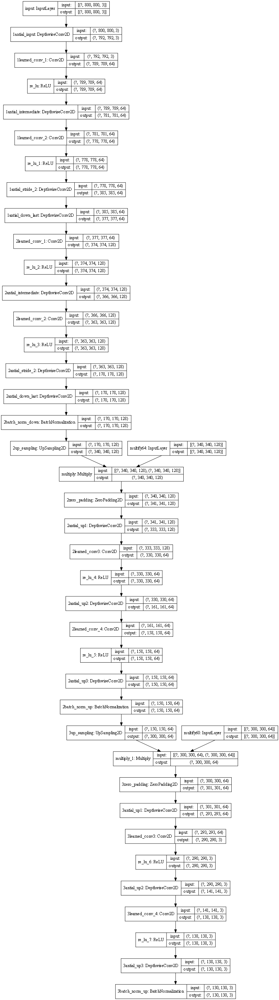

In [13]:
def filter_target(noise, kernel):
  reps = tf.shape(noise)[-1]
  channeled_kernel = tf.repeat(kernel, reps)
  noise = tf.nn.depthwise_conv2d(noise, tf.reshape(channeled_kernel, (kernel.shape[0], kernel.shape[1], reps, 1)), [1, 1, 1, 1], padding = "VALID")
  return noise

# Initialize random noise input
z = inp

z = tf.expand_dims(z, axis = 0)

target = tf.expand_dims(re, axis = 0)

target = filter_target(target, windowedkernel_cutoff_pi)

tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

## Define loss and optimizer

L2 loss is used. Adam optimizer is used.

In [14]:
def model_loss(gen_output, target):

  l2_loss = tf.reduce_mean((target - gen_output)**2)

  return l2_loss

def select_optimizer():
  #optimizer = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.5, beta_2=0.99, epsilon=1e-07)
  optimizer = tf.keras.optimizers.Adam()
  return optimizer

optimizer = select_optimizer()

## Image saving, training step, and fit function
Save losses to TensorBoard, show and save network output and show some basic stats every `save_every` epochs. Save trained network when fitting is finished, after `epochs` epochs.

In [15]:
save_every = 100 # How many epochs to skip between data display and saving

checkpoint_dir = './training_checkpoints_downup'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(model=model)
checkpoint.save(file_prefix=checkpoint_prefix)

def checkpoint_save(epoch, inEpochs = 100):
  if (epoch + 1) % inEpochs == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

def generate_images(model, z, multify62, multify60, target, save = False, epoch = 0): # the training parameter is for batchnorm, in case it is used
  prediction = model([z, multify62, multify60], training=False)
  plt.figure(figsize=(10, 10))
  # red = channel 0, green = channel 1, blue = channel 0
  first = prediction[0, ...]
  second = target[0, ...]
  display_list = [first, second]
  title = ['Network output', 'Target']
  
  if save:
    name = str(epoch).zfill(4)
    tf.keras.preprocessing.image.save_img((im_dir + str(name) + ".png"), first)

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()
  
@tf.function
def train_step(z, multify62, multify60, target, epoch):
  with tf.GradientTape() as tape:
    gen_output = model([z, multify62, multify60], training=True)
    loss = model_loss(gen_output, target)
    
  gradients = tape.gradient(loss, model.trainable_variables)
  
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))
  
  with summary_writer.as_default():
    tf.summary.scalar('model_loss', loss, step=epoch)

def fit(epochs):
  for epoch in range(epochs + 1):
    checkpoint_save(epoch)
    # Train
    start = time.time()
    if epoch > 0:
      train_step(z, multify62, multify60, target, epoch)
    elapsed = time.time() - start
    if epoch % save_every == 0 or epoch == epochs:
      #display.clear_output(wait=True)
      generate_images(model, z, multify62, multify60, target, save = True) #training = ?
      if epoch == 0:
        print("Before fitting")
      else:
        print('Training epoch {}, took {} s\n'.format(epoch, elapsed))
      print("Loss: " + str(tf.keras.backend.get_value(model_loss(model([z, multify62, multify60], training=True), target))))
      print("RMS deviance: " + str(tf.keras.backend.get_value(tf.math.sqrt(tf.reduce_mean((target - model([z, multify62, multify60], training=True))**2)))))
      print("Learned Min: " + str(tf.keras.backend.get_value(tf.math.reduce_min(model.get_layer('1learned_conv_1').get_weights()[0]))))
      print("Learned RMS: " + str(tf.keras.backend.get_value(tf.math.sqrt(tf.math.reduce_mean(model.get_layer('1learned_conv_1').get_weights()[0]**2)))))
      print("Learned Max: " + str(tf.keras.backend.get_value(tf.math.reduce_max(model.get_layer('1learned_conv_1').get_weights()[0]))))
    
  checkpoint.save(file_prefix=checkpoint_prefix)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


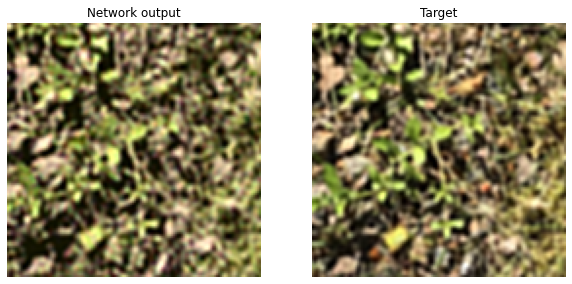

In [19]:
generate_images(model, z, multify62, multify60, target)

## Initiate image and log dirs and TensorBoard

In [20]:
import datetime
log_dir = "logs/"
im_dir = "images/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
os.makedirs(im_dir)
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [22]:
%reload_ext tensorboard
%tensorboard --logdir {log_dir} --host localhost --port 6201

Reusing TensorBoard on port 6201 (pid 11872), started 0:05:10 ago. (Use '!kill 11872' to kill it.)

## Fit the model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


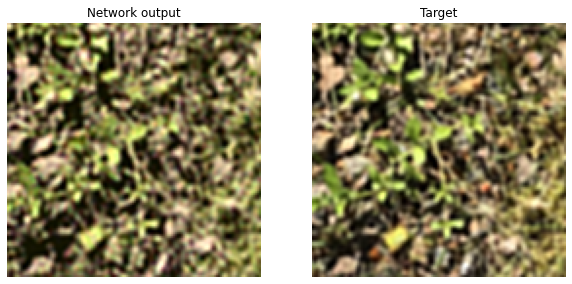

Before fitting
Loss: 0.0013057834
RMS deviance: 0.036135625
Learned Min: -1.1231666
Learned RMS: 0.5698727
Learned Max: 1.1039826


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


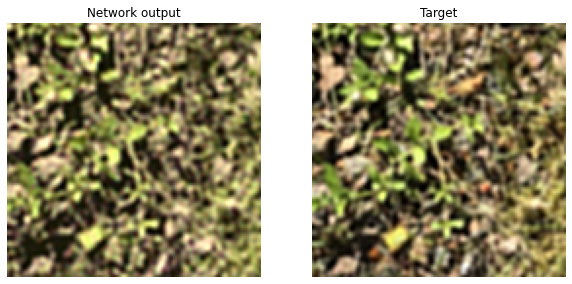

Training epoch 100, took 0.8286159038543701 s

Loss: 0.0010278379
RMS deviance: 0.03205991
Learned Min: -1.1243699
Learned RMS: 0.5699143
Learned Max: 1.1025519


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


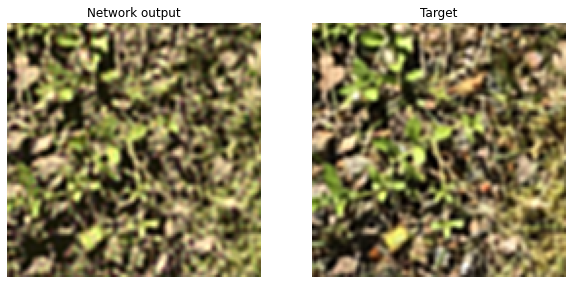

Training epoch 200, took 0.6974496841430664 s

Loss: 0.0009402797
RMS deviance: 0.03066398
Learned Min: -1.1239744
Learned RMS: 0.569923
Learned Max: 1.1035163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


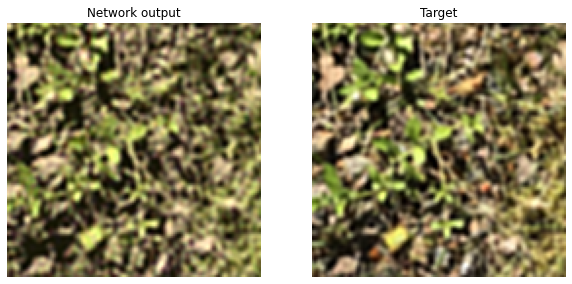

Training epoch 300, took 0.8556313514709473 s

Loss: 0.00091940805
RMS deviance: 0.030321741
Learned Min: -1.1239492
Learned RMS: 0.5699314
Learned Max: 1.1043965


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


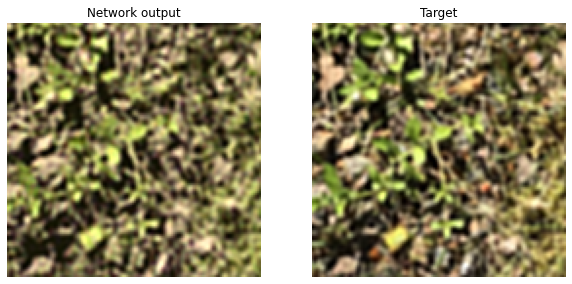

Training epoch 400, took 0.7818129062652588 s

Loss: 0.00092121627
RMS deviance: 0.030351546
Learned Min: -1.1239649
Learned RMS: 0.5699365
Learned Max: 1.1055293


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


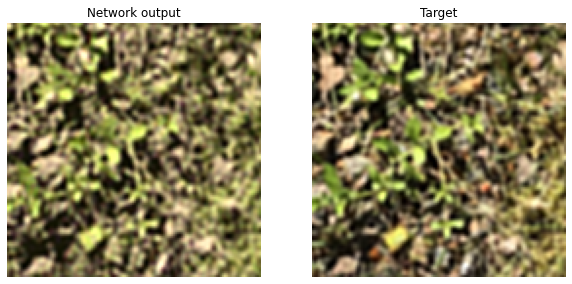

Training epoch 500, took 0.7382388114929199 s

Loss: 0.0010864193
RMS deviance: 0.032960877
Learned Min: -1.1232619
Learned RMS: 0.56994516
Learned Max: 1.1062576


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


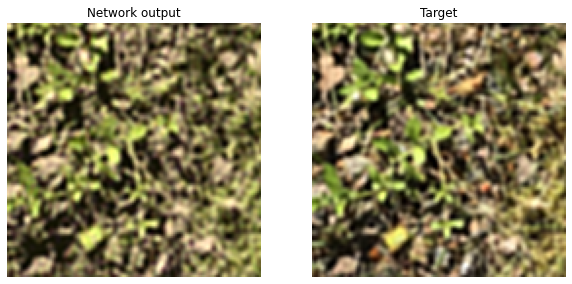

Training epoch 600, took 0.7381293773651123 s

Loss: 0.000746516
RMS deviance: 0.027322445
Learned Min: -1.122772
Learned RMS: 0.56994575
Learned Max: 1.1067151


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


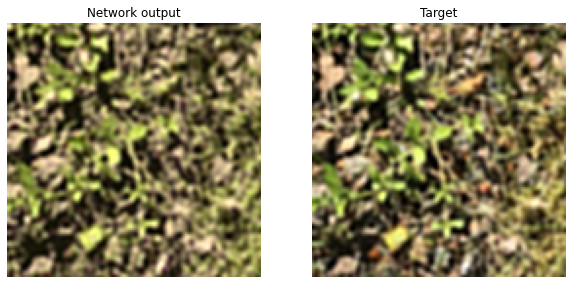

Training epoch 700, took 0.8613240718841553 s

Loss: 0.00075229263
RMS deviance: 0.027427953
Learned Min: -1.122422
Learned RMS: 0.56996065
Learned Max: 1.1075263


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


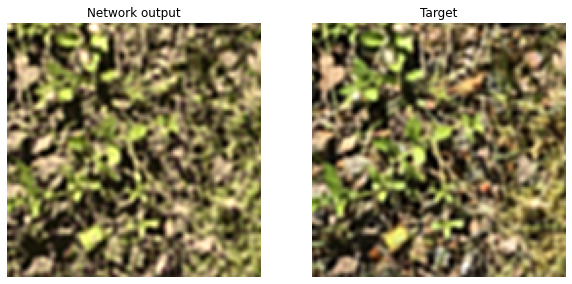

Training epoch 800, took 0.7377424240112305 s

Loss: 0.00093404483
RMS deviance: 0.030562147
Learned Min: -1.1218998
Learned RMS: 0.56997687
Learned Max: 1.1081469


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


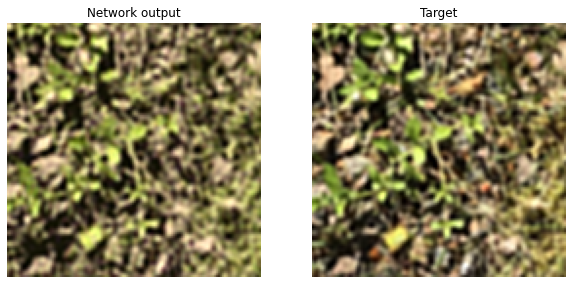

Training epoch 900, took 0.7679927349090576 s

Loss: 0.00067373074
RMS deviance: 0.025956323
Learned Min: -1.1217744
Learned RMS: 0.56999344
Learned Max: 1.1085283


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


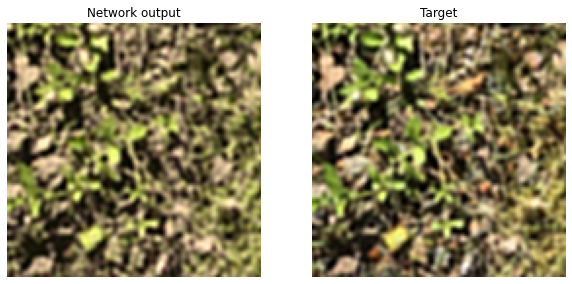

Training epoch 1000, took 0.9409968852996826 s

Loss: 0.00063610624
RMS deviance: 0.025221147
Learned Min: -1.121772
Learned RMS: 0.5700045
Learned Max: 1.1088595


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


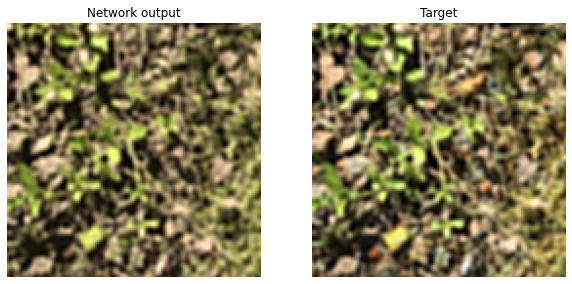

Training epoch 1100, took 0.7750072479248047 s

Loss: 0.0007293006
RMS deviance: 0.027005566
Learned Min: -1.121631
Learned RMS: 0.57001734
Learned Max: 1.108712


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


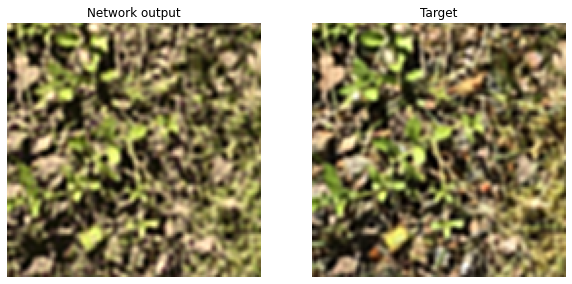

Training epoch 1200, took 0.7286193370819092 s

Loss: 0.0005912824
RMS deviance: 0.024316298
Learned Min: -1.121057
Learned RMS: 0.57002825
Learned Max: 1.1091479


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


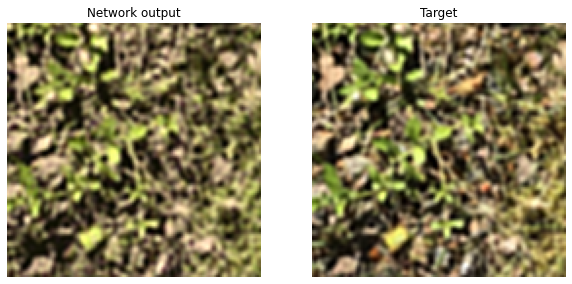

Training epoch 1300, took 0.8449199199676514 s

Loss: 0.0006088797
RMS deviance: 0.024675488
Learned Min: -1.1219326
Learned RMS: 0.5700463
Learned Max: 1.1090615


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


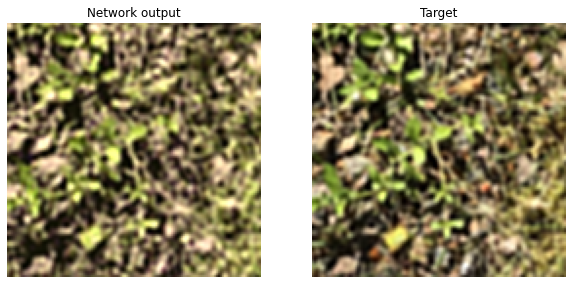

Training epoch 1400, took 0.6981067657470703 s

Loss: 0.0006435529
RMS deviance: 0.025368344
Learned Min: -1.1204976
Learned RMS: 0.5701109
Learned Max: 1.1073802


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


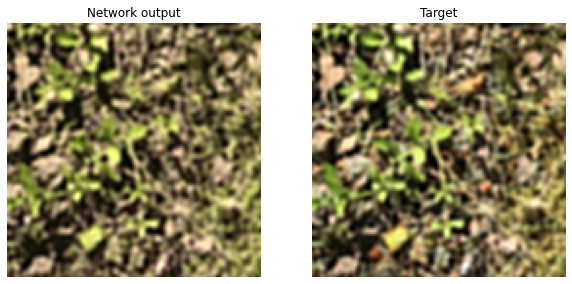

Training epoch 1500, took 0.7681474685668945 s

Loss: 0.00055559276
RMS deviance: 0.023571014
Learned Min: -1.1210979
Learned RMS: 0.5701071
Learned Max: 1.108585


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


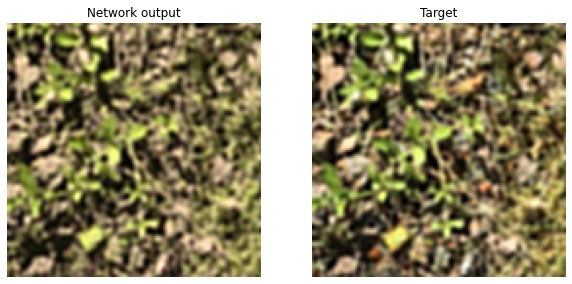

Training epoch 1600, took 0.8736557960510254 s

Loss: 0.0006321936
RMS deviance: 0.02514346
Learned Min: -1.12088
Learned RMS: 0.57011503
Learned Max: 1.1090975


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


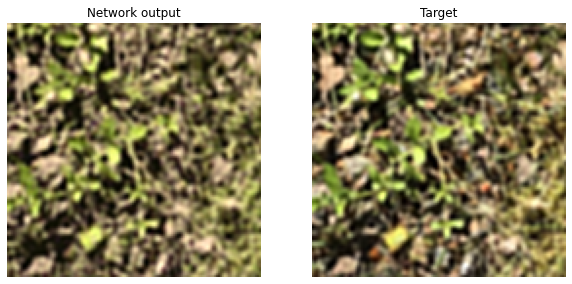

Training epoch 1700, took 0.8607420921325684 s

Loss: 0.0005208773
RMS deviance: 0.022822736
Learned Min: -1.1206049
Learned RMS: 0.57013315
Learned Max: 1.1092079


In [ ]:
EPOCHS = 10000
fit(EPOCHS)

In [18]:
def load_ckpt(latest = True, number = 18):
  if latest:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
  else:
    checkpoint.restore('training_checkpoints_downup/ckpt-' + str(number))

load_ckpt(False, 18)